<img src="Figures/logo_trans.png" width="180px" alt="LyonHPC" />
<img width="200px" src="Figures/python-logo.gif" alt="LyonHPC"/>

# Algorithmes numériques

<img src="recette_crepes_algorithme.png" alt="algorithme" width="500px"/>

In [41]:
%matplotlib inline
from IPython.display import HTML
import numpy as np
import matplotlib.pyplot as plt
plt.rc('font', family='serif', size='16')


## Bibliothèques scientifiques sous Python

**documentation** 

- Numercal Python **numpy** http://www.numpy.org/
- Scientific Python **scipy** http://docs.scipy.org/doc/scipy/reference


## Algorithme récursif

**récursion** méthode algorithmique où la solution du problème s'exprime en fonction de solutions du même problème, mais sur des données plus petites.

- Très utilisé en informatique, car fournit des solutions élégantes.

- Attention, peut être inefficace (comparé à l'itération)

### Exemple 1: calcul du PGCD de 2 entiers

     - PGCD(a,b)=PGCD(a-b,b) si a>b
     - PGCD(a,b)=PGCD(b-a,a) si a<b
     - PGCD(a,a)=a

#### Algorithme PGCD recursif

     Algorithme PGCD(a,b)
      si a == b 
         retour a
      sinon si a > b
         retour PGCD(a-b,b)
      sinon
         retour PGCD(b-a,a)
         
#### Programme Python

In [12]:
def PGCD(a,b):
    print("appel PGCD(",a,",",b,")")
    if a==b:
        return a
    elif a>b:
        return PGCD(a-b,b)
    else:
        return PGCD(b-a,a)
#
print(PGCD(9,21))

appel PGCD( 9 , 21 )
appel PGCD( 12 , 9 )
appel PGCD( 3 , 9 )
appel PGCD( 6 , 3 )
appel PGCD( 3 , 3 )
3


### Exemple 2: calcul du déterminant d'une matrice
soit $A$ une matrice d'ordre $n$, la méthode de Cramer permet le 
calcul récursif du déterminant par développement par rapport à la 1ere colonne

$$ det(A) = \sum_{k=1}^n (-1)^{k+1} A_{k,1} \times det(A^k) $$ 

où $A^k$ est la sous-matrice obtenu par élimination de la colonne 1 et de  la ligne $k$ de $A$

Pour une matrice de dimension 1

$$ det(a) = a $$

#### Algorithme déterminant

     Algorithme determinant(A)
         n = dim(A)
         si n==1 alors
             retour A[0,0]
         fin si
         # A1 sous matrice d'ordre n-1
         A1 = tableau(n-1,n-1)
         det = 0
         signe = 1
         # développement par rapport a la 1ere colonne
         pour k de 0 a n-1
             # sous matrice Ak
             A1[0:k,:] = A[0:k ,1:n]
             A1[k:,:]  = A[k+1:,1:n]
             det = det + signe*A[k,0]*determinant(A1)
             signe = -signe
             fin pour
         retour det
         
#### Programme Python

In [13]:
def determinant(A):
    """ calcul du déterminant d'une matrice A """
    n=A.shape[0]
    print("determinant ",n)
    if n==1 :
        return A[0,0]
    A1 = np.zeros((n-1,n-1))
    det = 0.
    signe = 1
    for k in range(n):
        if k>0:
            A1[0:k,:] = A[0:k,1:n]
        if k<n-1:
            A1[k:,:]  = A[k+1:n,1:n]
        print("dvt ligne ",k,n)
        det = det + signe*A[k,0]*determinant(A1)
        signe = -signe
    return det
#
M = np.array([[2.,0.,0],[0.,3.,0],[0,0,4.]])
delta = determinant(M)

determinant  3
dvt ligne  0 3
determinant  2
dvt ligne  0 2
determinant  1
dvt ligne  1 2
determinant  1
dvt ligne  1 3
determinant  2
dvt ligne  0 2
determinant  1
dvt ligne  1 2
determinant  1
dvt ligne  2 3
determinant  2
dvt ligne  0 2
determinant  1
dvt ligne  1 2
determinant  1


### Exercise: tour de Hanoi
Ecrire un algorithme récursif pour résoudre le problème des [tours de Hanoi](https://fr.wikipedia.org/wiki/Tours_de_Hano%C3%AF)

## Tri d'un tableau

### tri par insertion

> algorithme de tri classique: on  compare successivement chaque élément du tableau en l'insérant au non endroit dans le tableau (méthode classique de tri d'un jeu de carte)

#### principe
<img src="liste.png" alt="liste" width="400px"/>

#### algorithme

    # Tri d'un tableau X de n éléments
    Algorithme Tri_insertion(X)
        n=dimension de X
        pour i de 1 a n-1 faire  # trie des élts
            x = T[i]  # élément a trier
            j = i     # position
            tant que (j>0) et (T[j-1]>x) faire
                T[j] = T[j-1] # permute j et j-1
                j = j -1  # nouvelle position de x
            fin tant que
            T[j] = x  # position de l’élément 
        fin i
        retour # le tableau X est trie
        
**Visualisation de l'algorithme en Python**

In [42]:
#HTML('<iframe width="800" height="450" frameborder="0" src="http://pythontutor.com/iframe-embed.html#code=def+tri_insertion(X)%3A%0A++++n%3Dlen(X)%0A++++for+i+in+range(1,n)%3A%0A++++++++x%3DX%5Bi%5D%0A++++++++j%3Di%0A++++++++while+(j%3E0)+and+(X%5Bj-1%5D%3Ex)%3A%0A++++++++++++X%5Bj%5D+++%3D+X%5Bj-1%5D%0A++++++++++++j+%3D+j+-+1%0A++++++++X%5Bj%5D+%3D+x%0A++++return%0AX%3D%5B5,3,4,1%5D%0Atri_insertion(X)&cumulative=false&heapPrimitives=false&drawParentPointers=false&textReferences=false&showOnlyOutputs=false&py=2&curInstr=38&codeDivWidth=350&codeDivHeight=400"> </iframe>')

**Efficacité** $O(n^2)$

- algorithme assez efficace pour $n$ petit ou des tableaux presque triés
- tri sur place
- il existe des méthodes de tri plus efficaces (tri bulle, ...)

### Algorithme de tri de la bibliothéque numpy
**sort**: méthode de trie plus efficace (tri rapide ou quicksort), renvoi
le tableau trié

In [15]:
from numpy import *
X=array([5,3,4,1])
sort(X)

array([1, 3, 4, 5])

## Recherche de la racine $F(x)=0$

- méthode itérative à partir d'une estimation $x_0$ 
- methode de Newton: $x_{n+1}= x_n - \frac{F(x_n)}{F'(x_n)}$
- méthode de la sécante: Newton avec $F'(x_n) \approx \frac{F(x_n)-F(x_{n-1})}{x_n - x_{n-1}}$

<img src="newton.png" alt="newton" width="300px"/>

fonction **fsolve** dans scipy.optimize


- généralisation dans $\mathbf{R}^p$, on remplace $F'(x_n)$ par la matrice Jacobienne $J = \{\frac{\partial F_i}{\partial x_j}\} $


racine= [-1.02986653] erreur= [0.]
nbre d evaluation de F :  9
racine= [-1.02986653] erreur= [0.]
nbre d evaluation de F:  10


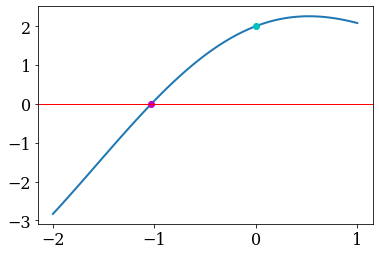

In [21]:
from numpy import *
import matplotlib.pyplot as plt
from scipy.optimize import fsolve
# fonction et sa dérivée
def F(x):
    return x+2*cos(x)
def dF(x):
    return 1-2*sin(x)
# analyse
x0=0.
xe=fsolve(F,x0,fprime=dF)
X=linspace(-2,1,100)
plt.plot(X,F(X),lw=2)
plt.plot(x0,F(x0),'co')
plt.plot(xe,F(xe),'mo')
plt.axhline(y=0,color='r',lw=1)
# racine
x1=fsolve(F,x0,fprime=dF)
print("racine=",x1,"erreur=",F(x1))
# sortie detaillee
[x1,infodict,ierr,mesg]=fsolve(F,x0,fprime=dF,full_output=True)
print("nbre d evaluation de F : ",infodict['nfev'])
# idem mais sans utiliser la dérivée (estimation par differences finies)
x1=fsolve(F,x0)
print("racine=",x1,"erreur=",F(x1))
[x1,infodict,ierr,mesg]=fsolve(F,x0,full_output=True)
print("nbre d evaluation de F: ",infodict['nfev'])

### Exercice d'application

Un projectile de masse $M$ est tiré avec un angle $\alpha$ et une vitesse initiale $U_0$. En tenant compte de la résistance de l'air qui exerce une force proportionnelle à la vitesse $F=K U$, la trajectoire du projectile est donnée par:

\begin{eqnarray}
x(t)&=& C\cos{\alpha} (1-e^{-t/C})\\
y(t)&=& (C\sin{\alpha}+32C^2)(1-e^{-t/C}) - 32 C t
\end{eqnarray}

avec $C=M/K$.
Écrire un programme python permettant de calculer le temps et la distance du point d'impact.

AN: $\alpha=45°$, $U_0=40 m/s$

## Polynômes

soit le polynôme $P(x)$ de degré $n$

$$P(x) = \sum_{i=0}^n a_i x^i $$

Pour évaluer ce polynôme, on peut programmer direction la relation précédente:


In [22]:
def EvalPoly(X,A):
    """ evaluation du polynôme de coefficient A[i] en x """
    somme = zeros(size(X))
    for i,a in enumerate(A):
        somme = somme + a*X**i
    return somme
#
A=array([1.,2.,3.,4.])
X=array([1.0,-1.,2.,-2.])
print(EvalPoly(X,A))
A=2*random.rand(20)-1.
X=2*random.rand(100)-1.
%timeit EvalPoly(X,A)

[ 10.  -2.  49. -23.]
107 µs ± 10.7 µs per loop (mean ± std. dev. of 7 runs, 10000 loops each)


Pour évaluer $P(x)$ on peut aussi utiliser la forme factorisée de Hörner, en récrivant $P(x)$

$$ P(x) = a_0 + x* (a_1 + x*(a_2 + x*( \cdots  x*(a_{n_1} + a_n =*x)$$

In [23]:
def Horner(X,A):
    """ evaluation du polynôme de coefficient A[i] en x par l'algorithme de Horner"""
    somme = zeros(size(X))
    for a in reversed(A):
        somme = X*somme + a
    return somme
#
A=array([1.,2.,3.,4.])
X=array([1.0,-1.,2.,-2.])
print(Horner(X,A))
A=2*random.rand(20)-1
X=2*random.rand(100)-1.
%timeit Horner(X,A)

[ 10.  -2.  49. -23.]
47.3 µs ± 11.6 µs per loop (mean ± std. dev. of 7 runs, 10000 loops each)


La formule factorisée de Hörner est donc beaucoup plus efficace!!
C'est celle utilisée dans la bibliothéque numpy

In [24]:
from numpy.polynomial.polynomial import polyval
A=array([1.,2.,3.,4.])
X=array([1.0,-1.,2.,-2.])
print(polyval(X,A))
A=2*random.rand(20)-1
X=2*random.rand(100)-1.
%timeit polyval(X,A)

[ 10.  -2.  49. -23.]
59.4 µs ± 9.17 µs per loop (mean ± std. dev. of 7 runs, 10000 loops each)


## Interpolation
### Interpolation de Lagrange
Soient $N+1$ points $\left\{ X_i,Y_i \right\}_{i=0..N}$, le polynôme d’interpolation de Lagrange est le polynôme de degré $N$ passant par ces $N+1$ points.
<img src="interp.png" alt="newton" width="400px"/>

### Formule de Lagrange (instable si $N>10$)

$$P(x) = \sum_{i=0}^N Y_i L_i(x) \mbox{ avec } L_i(x) = \frac{\prod_{j=0, j\neq i}^N (X-X_j)}{\prod_{j=0, j\neq i}^N (X_i-X_j)} $$

        # bibliotheque scipy
        scipy.interpolate.lagrange
    
### Pour $N$ grand: interpolation locale (linéaire, spline, ..)

        # bibliotheque scipy
        scipy.interpolate.interp1d

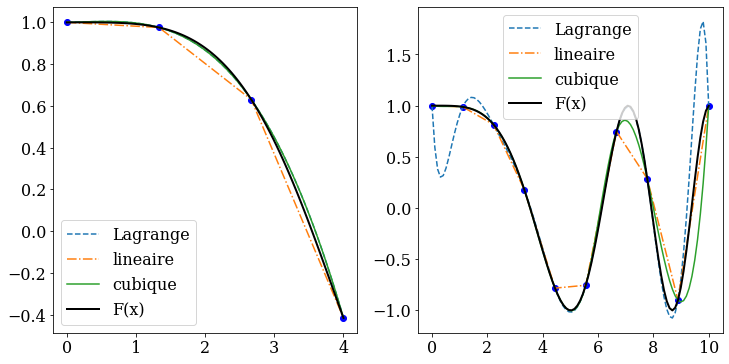

In [25]:
from scipy.interpolate import lagrange,interp1d

# fonction a interpoler
F=lambda x:cos(x**2/8.)
# interpolation sur 4 points
Xp1=linspace(0,4,4)
Yp1=F(Xp1)
X1=linspace(0,4,100)
P =lagrange(Xp1,Yp1)
P1=interp1d(Xp1,Yp1)
P3=interp1d(Xp1,Yp1,'cubic')
# puis sur 10 points
Xp2=linspace(0,10,10)
Yp2=F(Xp2)
X2=linspace(0,10,100)
Q =lagrange(Xp2,Yp2)
Q1=interp1d(Xp2,Yp2)
Q3=interp1d(Xp2,Yp2,'cubic')
# tracer
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.plot(Xp1,Yp1,"bo")
plt.plot(X1,P(X1),'--',label="Lagrange")
plt.plot(X1,P1(X1),'-.',label="lineaire")
plt.plot(X1,P3(X1),'-',label="cubique")
plt.plot(X1,F(X1),'k-',lw=2,label="F(x)")
plt.legend(loc=0)
plt.subplot(1,2,2)
plt.plot(Xp2,Yp2,"bo")
plt.plot(X2,Q(X2),'--',label="Lagrange")
plt.plot(X2,Q1(X2),'-.',label="lineaire")
plt.plot(X2,Q3(X2),'-',label="cubique")
plt.plot(X2,F(X2),'k-',lw=2,label="F(x)")
plt.legend(loc=0)

### Droite des moindres carrées

 Soient $n$ couples de points expérimentaux: $(X_i,Y_i)_{i=0,n-1}$, on cherche à lisser ces points par la droite des moindres carrés: $y = a x +b $
 
<img src="moindrescarres.png" alt="moindres carrés" width="280px"/>
 
**Principe**

 on détermine la droite $y = a x + b$ qui minimise l'erreur $Err$ entre les points de mesure et les points de la droite:
 
$$ Err(a,b) = \sum_{i=0}^{n-1} \Delta_i ^2 $$

où $\Delta_i ^2 = (a X_i +b - Y_i)^2$ représente le carré de l'erreur entre un point de mesure $(X_i,Y_i)$ et le point correspondant de la droite  $(X_i, a X_i + b)$  

Les valeurs de $a$ et $b$ sont déterminées en minimisant l'erreur $Err(a,b)$ par rapport à $a$ et $b$, i.e. tel que $\frac{\partial Err}{\partial a} = 0 $ et  $\frac{\partial Err}{\partial b} = 0$

On obtient ainsi le système linéaire de 2 équations:

$$  a \overline{X} + b  = \overline{Y} \mbox{ avec }  \overline{X}=\frac{1}{n}\sum_{i=0}^{n-1}{X_i} \mbox{ et } \overline{Y}=\frac{1}{n}\sum_{i=0}^{n-1}{Y_i}$$

$$  a \overline{X^2} + b \overline{X} =  \overline{XY} \mbox{ avec } \overline{X^2}=\frac{1}{n}\sum_{i=0}^{n-1}{X_i^2} \mbox{ et } \overline{XY}=\frac{1}{n}\sum_{i=0}^{n-1}{X_i Y_i}$$

dont la solution s'écrit:

$$ a = \frac{\overline{XY}- \overline{X}\ \overline{Y}}{\overline{X^2}- (\overline{X})^2} \mbox{ et }  b = \overline{Y} - a \overline{X} $$


## Intégration

formule de quadrature par approximation de la fonction $f(x)$ par un polynôme d'interpolation $P(x)$

$$ \int_a^b{f(x)\,dx} \approx \int_a^b{P(x)\,dx} = \sum_{i=0}^N w_i f(x_i) $$

### méthode des trapèzes (P(x) polynôme de degré 1 par morceaux)

$$ \int_a^b{f(x)\,dx} \approx \sum_{i=1}^N h\frac{f(a+ih)+f(a+(i-1)h)}{2}
\mbox{ avec } h=\frac{b-a}{N}$$

**méthode d'ordre 2**: erreur $O(h^2)$

    # librairie scipy
    scipy.integrate.cumtrapz
    
### méthode de Simpson (P(x) polynôme de degré 2 par morceaux)

$$ \int_a^b{f(x)\,dx} \approx \sum_{i=1}^N h\frac{f(a+ih)+4f(a+(i-\frac{1}{2})h)+f(a+(i-1)h)}{6}
\mbox{ avec } h=\frac{b-a}{N}$$

**méthode d'ordre 4**: erreur $O(h^4)$

        # librairie scipy
        scipy.integrate.simps
    
### méthode de Gauss

- on utilise des points de Gauss comme points d'interpolation
- avec $N$ points de Gauss, formule exacte pour des polynômes de degré $\leq 2n+1$
- très précise pour $f(x)$ analytique

        # bibliotheque scipy
        scipy.integrate.quadrature
        
### Comparaison des méthodes

Calcul de $I = \int_0^\pi \sin x\, dx = 2$

In [26]:
def Simpson(Y,dx):
    """ Calcul de l'integrale par la mehode de simspon
        Y valeurs de f(x) en 2N+1 points distants de dx """
    somme = 0.
    N = size(Y)//2
    for i in range(N):
        somme = somme + Y[2*i+2]+4*Y[2*i+1]+Y[2*i]
    return somme*dx/3.
#
N=20
X=linspace(0,pi,2*N+1)
dx=X[1]-X[0]
Y=sin(X)
print("Simpson=",Simpson(Y,dx))
# libaririe
from scipy.integrate import simps,cumtrapz
print("simps=",simps(Y,dx=dx))
print("trapz=",cumtrapz(Y,dx=dx)[-1])
# Gauss
from scipy.integrate import quadrature
print("Gauss=",quadrature(sin,0,pi,maxiter=7))

Simpson= 2.0000004230931827
simps= 2.000000423093183
trapz= 1.9989718104970657
Gauss= (2.0000000000017897, 5.245182066460075e-10)


## Equations différentielles

### Equation différentielle du 1er ordre

$$ \frac{d Y}{d t} = F(t,Y) \mbox{ avec la C.I. } Y(0)=Y_0$$

- $Y(t)$ est une courbe dont l'équation donne la tangente
- calcul de la trajectoire à partir de la vitesse
- approximation de $\frac{d Y}{d t}$ par différences finies

$$ \frac{d Y}{d t} = \lim_{\Delta t \rightarrow \infty}{\frac{\Delta Y}{\Delta t}} \approx \frac{Y_{n+1}-Y_n}{\Delta t}$$


### Méthode de Runge Kutta d'ordre 2

$$ Y_{n+1} = Y_n + \Delta t F(Y_{n+1/2},t_n + \frac{\Delta t}{2}) \mbox{ avec } Y_{n+1/2} = Y_n + \frac{\Delta t}{2} F(Y_n,t_n) $$

- approximation de la tangente au milieu de l'intervalle
- méthode d'ordre 2

<img src="RungeKutta.png" alt="RungeKutta" width="500px"/>

In [27]:
def RungeKutta2(F,Y0,t0,dt):
    """ integration par RK2 de dY/dt=F(t,Y) de t0 a t0+dt avec Y(t0)=Y0 """
    return Y0 + dt*F(t0 + dt/2. ,Y0 + dt/2.*F(t0,Y0))

**utilisation bibliotheque scipy**

    import scipy
    # Bibliothéque scipy.integrate.ode 
    nom='dopri5'
    methode = scipy.integrate.ode(F).set_integrator(nom)
    # nom = methode d'integration
    # 'dopri5' methode Runge Kutta d'ordre 4(5)
    # 'lsoda'  methode implicite (Adams Bashford et BDF)
    methode.set_initial_value(Y0,t0)
    methode.integrade(t)

### exemple: intégration de dY/dt = Y avec Y(0)=1 
solution $Y(t)=e^t$

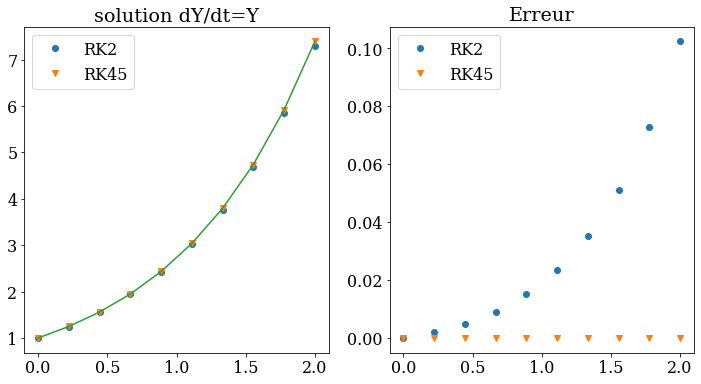

In [32]:
from numpy import *
import matplotlib.pyplot as plt
from scipy.integrate import ode
# second membre EDO
def F(t,Y):
    return Y
# parametres
t0 = 0.;  Y0 = 1.
tf = 2.;  N  = 10
T=linspace(t0,tf,N)
# methode RK2
Y2=zeros(N)
Y2[0]=Y0
Yex = exp(T)
dt=T[1]-T[0]
for i in range(1,N):
    Y2[i] = RungeKutta2(F,Y2[i-1],T[i-1],dt)
# scipy ode
Y4=zeros(N)
Y4[0]=Y0
RK45=ode(F).set_integrator('dopri5')
RK45.set_initial_value(Y0,t0)
for i in range(1,N):
    Y4[i]=RK45.integrate(T[i])
# tracer
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.plot(T,Y2,'o',label="RK2")
plt.plot(T,Y4,'v',label="RK45")
plt.plot(T,Yex)
plt.title('solution dY/dt=Y')
plt.legend(loc=0)
plt.subplot(1,2,2)
plt.plot(T,abs(Y2-Yex),'o',label="RK2")
plt.plot(T,abs(Y4-Yex),'v',label="RK45")
plt.title('Erreur')
plt.legend(loc=0)
plt.show()

### Equation différentielle du second ordre

$$\frac{d^2 y}{d t^2} = f(t,y,\frac{dy}{dt}) \mbox{ avec les C.I. : } y(0)=y_0, \frac{dy}{dt}(0)=u_0$$

- transformation en un système EDO d'ordre 1:

$$ \frac{d Y}{dt} = F(t,Y) $$

- on pose $Y_1 = y$ et $Y_2 = \frac{dy}{dt}$

$$ \frac{d}{dt} \left[\begin{array}{c}
Y_1 \\
Y_2 \\
\end{array}\right] = \left[\begin{array}{c}
Y_2 \\
f(t,Y_1,Y_2) \\
\end{array}\right] \mbox{ avec } Y_1(0)=y_0 \mbox{ et } Y_2(0)=u_0$$

### Méthode de Verlet (1967)

- Intégration de l' équation du mouvement en astrophysique et dynamique moléculaire
- Equation de Newton avec des forces $F$ dépendants de la position $X(t)$

$$ M \frac{d^2 X}{dt^2} = F(X(t)) \mbox{ avec } X(0)=X_0, \frac{dX}{dt}(0)=V_0$$

- Approximation centrée d'ordre 2 de la dérivée seconde

$$ \frac{d^2 X}{dt^2} = \lim_{\Delta t \rightarrow \infty}{\frac{\Delta}{\Delta t}(\frac{\Delta X}{\Delta t})}\approx \frac{X_{n+1}-2X_n+X_{n-1}}{\Delta t^2}$$

**Algorithme de Verlet **

$$ X_{n+1} = 2X_n - X_{n-1} + \Delta t^2 A(X_n) \mbox{ avec } A(X)=M^{-1} F(X) $$

- erreur d'ordre 4, simplectique pour les systèmes Hamiltonien (conservatif)

- démarrage des itérations (ordre 3)

$$ X_1 = X_0 + \Delta t V_0 + \frac{\Delta t^2}{2} A(X_0) $$

### exemple: trajectoire de la terre autour du soleil 

loi de la gravitation universelle: planete masse $m$ distante de $(x,y)$ d'un soleil masse $M$:

$$ \begin{cases}
m \frac{d^2 x}{dt^2} = - \frac{G M m }{r^2} \frac{x}{r} \\
m \frac{d^2 y}{dt^2} = - \frac{G M m }{r^2} \frac{y}{r} 
\end{cases}$$

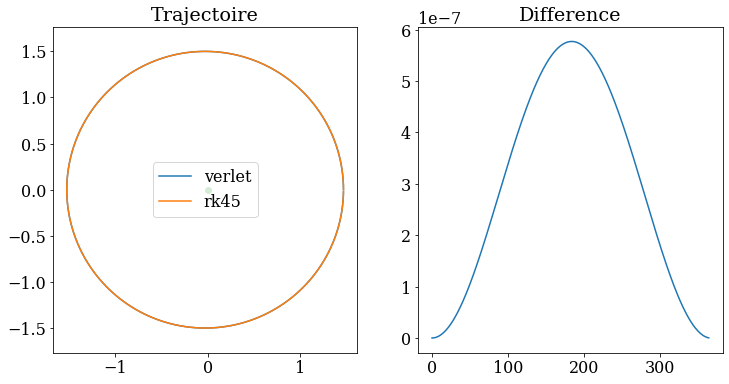

In [33]:
from numpy import *
import matplotlib.pyplot as plt
from scipy.integrate import ode
# unites astronomiques
LONG=1.e11
MASSE=1.e24 
JOUR=24.*3600
# constante
G=6.67e-11/(LONG**3/MASSE/JOUR**2)   # constante de gravitation en m^3/kg/s^2
M=2.0e30/MASSE                   # masse du soleil en kg
m=6.0e24/MASSE                   # masse de la terre en kg
r0=147.0e9/LONG                  # distance initiale terre soleil en m
u0=30.4e3*JOUR/LONG              # vitesse initiale en m/s
# nbre de jours d'integration 
N=365
# integration avec la methode de verlet
# =====================================
# calcul force attraction
def Force(x,y):
    r=sqrt(x*x+y*y)
    return G*M/r**3
#
t=linspace(0,N-1,N)
x=zeros(N); x[0]=r0
y=zeros(N); y[0]=0
# pas d'integration par jour
npj=20
dt=1./npj
# position initiale a t=t0 et t=t0-dt
x1=r0; y1=0.; a0 = 0.5*Force(x1,y1)*dt**2
x0 = x1         -a0*x1
y0 = y1 - u0*dt -a0*y1
# boucle d'integration
for i in range(1,N):
    for k in range(npj):
        a1 = Force(x1,y1)*dt**2
        x2 = 2*x1 - x0 -a1*x1
        y2 = 2*y1 - y0 -a1*y1
        x0=x1; y0=y1
        x1=x2; y1=y2
    x[i]=x2
    y[i]=y2
# integration avec RK45
# =====================
# second membre ODE d'ordre 1
def F(t,Y):
    r = sqrt(Y[0]*Y[0]+Y[1]*Y[1])
    a = G*M/r**3
    return [Y[2], Y[3], -a*Y[0], -a*Y[1]]
# scipy ode RK45
t4=linspace(0,N-1,N)
x4=zeros(N); x4[0]=r0
y4=zeros(N); y4[0]=0
Y0=array([r0,0,0,u0])
RK45=ode(F).set_integrator('dopri5')
RK45.set_initial_value(Y0,0.)
for i in range(1,N):
    [x4[i],y4[i],u4,v4]=RK45.integrate(t4[i])
# tracer
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.plot(x,y,label='verlet')
plt.plot(x4,y4,label='rk45')
plt.plot(0.,0.,'o')
plt.legend(loc=0)
plt.title("Trajectoire")
plt.axis('equal')
plt.subplot(1,2,2)
plt.plot(t4,sqrt(x**2+y**2)-sqrt(x4**2+y4**2))
plt.title("Difference")
plt.show()

## Exercices

### Swinging pendulum
On considère le mouvement de $N$ pendules simples de longueurs $L$ variables.

Écrire un programme python qui calcule le mouvement de ces pendules. Déterminez la répartition des longueurs $L$ permettant d'obtenir le type de mouvement ci-dessous avec $N=15$ pendules.

On comparera aussi le résultat avec les vidéos d'expériences trouvées sur le net.

In [34]:
from anim import trace_swing_pendulum
HTML(trace_swing_pendulum())

### pendule simple avec une corde souple
On considère les oscillations d'un pendule simple fixé à une corde souple de longueur maximum L et de masse négligeable par rapport au pendule. Lorsque la longueur de la corde est maximum, elle peut exercer uniquement une force de tension centripète sur la masse m du pendule.  Le pendule est lancé avec une vitesse initiale, et commence à osciller. Si la tension dans le fil devient nulle, le pendule est alors soumis uniquement à la force de gravité et sa trajectoire devient parabolique. Lors que cette trajectoire intercepte le cercle de longueur l, un choc se produit puisque le fil atteint alors sa longueur maximum et exerce à nouveau une tension sur le pendule. Ce choc est un choc mou avec perte d'énergie, et l'on suppose que ce choc est telle que la vitesse tangentielle se conserve et la vitesse normale s’annule. Le pendule se met alors à osciller, mais avec des oscillations de plus faibles amplitudes.

Ecrire un programme python qui calcule la trajectoire du pendule.

In [35]:
from anim import trace_pendulum
HTML(trace_pendulum())

### problème à N corps

On considère un système planétaire de $N$ masses en interaction gravitationnelle. La force exercée par la masse $m_i$ sur la masse $m_j$ est donnée par la relation de Newton:
$$ F_{i,j} = \frac{G m_i m_j}{r_{i,j}^2} \mbox{ avec } r_{i,j}=\mbox{distance entre les 2 masses}$$
$G$ est la constante de gravitation universelle. Pour $N=3$, on a le problème classique des 3 corps qui intrigue les physiciens depuis Newton. 

Écrire un programme python calculant la trajectoire de $N$ corps se trouvant dans un même plan, modélisant un système planétaire où la première masse représente le soleil et les autres masses les planètes.

Quelle est la complexité de l'algorithme en fonction de N ?

Dans le cas du système à trois corps Soleil-Terre-Jupiter, retrouver le mouvement du système solaire.

**unités**: Dans le système d'unités astronomiques, i.e. la distance $L_t=1.49\,10^{11}\,m$ de la terre au soleil comme unité de longueur, la masse $M_t=6\,10^{24}\,kg$ de la terre comme unité de masse, et l'année terrestre moyenne $T_t=365,25\,jours$ comme unité de temps, on a  $G=0.00012$. On a aussi la masse du Soleil $m_0=3.33\,10^5$, la masse de Jupiter $m_2=316.7$ et la distance Soleil Jupiter $r_2=5.2$.

Étudier le comportement du système lorsque la masse du soleil diminue.

Essayer de retrouver la solution périodique en huit découverte en 1993 par Christopher Moore.

In [36]:
from anim import trace_trois_corps
HTML(trace_trois_corps())

### pendule double: mouvement chaotic

On veut étudier le mouvement d'un double pendule par intégration des équations du mouvement.

Écrire un programme python pour calculer la position des 2 masses $m_1$ et $m_2$ au cours du temps.

On comparera la simulation aux vidéos d'expérience disponible sur le net.

<img src="Double_Pendulum.png" width="200px"/>

In [37]:
from anim import trace_double_pendulum
HTML(trace_double_pendulum())

### Évolution du volume d'une particule fluide
En suivant la trajectoire d'une particule fluide dans un champ de vitesse $U=[u(x,y),v(x,y)]$, on détermine la variation du volume $V(t) de la particule.

On veut vérifier la relation suivante:

$$ \frac{1}{V}\frac{D V}{Dt} = div\,U = \frac{\partial u}{\partial x}+\frac{\partial v}{\partial y}$$

Ecrire un programme python qui calcule la trajectoire $(x(t),y(t)$ d'une particule fluide:

$$ \frac{d x}{dt}= u(x,y) \mbox{ et } \frac{d y}{dt}= v(x,y)$$

et détermine la variation de son volume $V(t)$

In [39]:
from anim import trace_divergence
HTML(trace_divergence())

## FIN de la leçon

<img src="recette_crepes_algorithme.png" alt="algorithme" width="500px"/>